In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedShuffleSplit
from keras.models import Sequential
from keras.layers import Dense, Activation, Flatten, Convolution1D, Dropout
from keras.optimizers import SGD
from keras.utils import np_utils
from keras.callbacks import ModelCheckpoint
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import os

## A)Part1

### 1)loading data

In [2]:
train_data = pd.read_csv(r'C:\Users\rana ahmed\Desktop\Senior_2\deepLearingproject\Leaf-Classification\leaf-classification\train.csv')
test_data = pd.read_csv(r'C:\Users\rana ahmed\Desktop\Senior_2\deepLearingproject\Leaf-Classification\leaf-classification\test.csv')

### 2) describe it 

In [3]:
train_data.head()

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.0,0.0,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.0,0.0,0.000977,0.039062,0.022461
2,3,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.0,0.0,0.000000,0.020508,0.002930
3,5,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.0,0.0,0.017578,0.000000,0.047852
4,6,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.031250


In [4]:
train_data.shape

(990, 194)

In [5]:
train_data.dtypes

id             int64
species       object
margin1      float64
margin2      float64
margin3      float64
              ...   
texture60    float64
texture61    float64
texture62    float64
texture63    float64
texture64    float64
Length: 194, dtype: object

In [6]:
test_data.head()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,4,0.019531,0.009766,0.078125,0.011719,0.003906,0.015625,0.005859,0.0,0.005859,...,0.006836,0.000000,0.015625,0.000977,0.015625,0.0,0.0,0.000000,0.003906,0.053711
1,7,0.007812,0.005859,0.064453,0.009766,0.003906,0.013672,0.007812,0.0,0.033203,...,0.000000,0.000000,0.006836,0.001953,0.013672,0.0,0.0,0.000977,0.037109,0.044922
2,9,0.000000,0.000000,0.001953,0.021484,0.041016,0.000000,0.023438,0.0,0.011719,...,0.128910,0.000000,0.000977,0.000000,0.000000,0.0,0.0,0.015625,0.000000,0.000000
3,12,0.000000,0.000000,0.009766,0.011719,0.017578,0.000000,0.003906,0.0,0.003906,...,0.012695,0.015625,0.002930,0.036133,0.013672,0.0,0.0,0.089844,0.000000,0.008789
4,13,0.001953,0.000000,0.015625,0.009766,0.039062,0.000000,0.009766,0.0,0.005859,...,0.000000,0.042969,0.016602,0.010742,0.041016,0.0,0.0,0.007812,0.009766,0.007812


In [7]:
test_data.shape

(594, 193)

In [8]:
test_data.dtypes

id             int64
margin1      float64
margin2      float64
margin3      float64
margin4      float64
              ...   
texture60    float64
texture61    float64
texture62    float64
texture63    float64
texture64    float64
Length: 193, dtype: object

In [9]:
train_data.describe()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,...,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,799.595960,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,0.007167,...,0.036501,0.005024,0.015944,0.011586,0.016108,0.014017,0.002688,0.020291,0.008989,0.019420
std,452.477568,0.019739,0.038855,0.025847,0.028411,0.018390,0.052030,0.017511,0.002743,0.008933,...,0.063403,0.019321,0.023214,0.025040,0.015335,0.060151,0.011415,0.039040,0.013791,0.022768
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,415.250000,0.001953,0.001953,0.013672,0.005859,0.001953,0.000000,0.005859,0.000000,0.001953,...,0.000000,0.000000,0.000977,0.000000,0.004883,0.000000,0.000000,0.000000,0.000000,0.000977
50%,802.500000,0.009766,0.011719,0.025391,0.013672,0.007812,0.015625,0.015625,0.000000,0.005859,...,0.004883,0.000000,0.005859,0.000977,0.012695,0.000000,0.000000,0.003906,0.002930,0.011719
75%,1195.500000,0.025391,0.041016,0.044922,0.029297,0.017578,0.056153,0.029297,0.000000,0.007812,...,0.043701,0.000000,0.022217,0.009766,0.021484,0.000000,0.000000,0.023438,0.012695,0.029297
max,1584.000000,0.087891,0.205080,0.156250,0.169920,0.111330,0.310550,0.091797,0.031250,0.076172,...,0.429690,0.202150,0.172850,0.200200,0.106450,0.578130,0.151370,0.375980,0.086914,0.141600


In [10]:
test_data.describe()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,...,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000
mean,780.673401,0.017562,0.028425,0.031858,0.022556,0.014527,0.037497,0.019222,0.001085,0.007092,...,0.035291,0.005923,0.015033,0.011762,0.015881,0.011217,0.002617,0.019975,0.009389,0.020970
std,465.646977,0.019585,0.038351,0.025719,0.028797,0.018029,0.051372,0.017122,0.002697,0.009515,...,0.064482,0.026934,0.022318,0.024771,0.014898,0.052530,0.011204,0.034704,0.013457,0.023407
min,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,368.500000,0.001953,0.001953,0.013672,0.005859,0.001953,0.000000,0.005859,0.000000,0.001953,...,0.000000,0.000000,0.000977,0.000000,0.004883,0.000000,0.000000,0.000000,0.000000,0.000977
50%,774.000000,0.009766,0.010743,0.023438,0.013672,0.007812,0.013672,0.015625,0.000000,0.005859,...,0.003906,0.000000,0.005859,0.001953,0.012695,0.000000,0.000000,0.003418,0.002930,0.013184
75%,1184.500000,0.028809,0.041016,0.042969,0.027344,0.019531,0.056641,0.029297,0.000000,0.007812,...,0.038086,0.000000,0.019531,0.010498,0.022461,0.000000,0.000000,0.022461,0.014648,0.032227
max,1583.000000,0.085938,0.189450,0.167970,0.164060,0.093750,0.271480,0.087891,0.021484,0.083984,...,0.353520,0.441410,0.153320,0.177730,0.083984,0.606450,0.123050,0.247070,0.086914,0.149410


### 3) Check the data for missing values or duplicates and carry out proper correction methods

In [11]:
train_data.duplicated().sum()

0

In [12]:
test_data.duplicated().sum()

0

In [13]:
train_data.isnull().sum()

id           0
species      0
margin1      0
margin2      0
margin3      0
            ..
texture60    0
texture61    0
texture62    0
texture63    0
texture64    0
Length: 194, dtype: int64

In [14]:
test_data.isnull().sum()

id           0
margin1      0
margin2      0
margin3      0
margin4      0
            ..
texture60    0
texture61    0
texture62    0
texture63    0
texture64    0
Length: 193, dtype: int64

### 4)Visualize the data using proper visualization methods.

In [15]:
train_data['species'].nunique()

99

In [16]:
train_data['species'].unique()

array(['Acer_Opalus', 'Pterocarya_Stenoptera', 'Quercus_Hartwissiana',
       'Tilia_Tomentosa', 'Quercus_Variabilis', 'Magnolia_Salicifolia',
       'Quercus_Canariensis', 'Quercus_Rubra', 'Quercus_Brantii',
       'Salix_Fragilis', 'Zelkova_Serrata', 'Betula_Austrosinensis',
       'Quercus_Pontica', 'Quercus_Afares', 'Quercus_Coccifera',
       'Fagus_Sylvatica', 'Phildelphus', 'Acer_Palmatum',
       'Quercus_Pubescens', 'Populus_Adenopoda', 'Quercus_Trojana',
       'Alnus_Sieboldiana', 'Quercus_Ilex', 'Arundinaria_Simonii',
       'Acer_Platanoids', 'Quercus_Phillyraeoides', 'Cornus_Chinensis',
       'Liriodendron_Tulipifera', 'Cytisus_Battandieri',
       'Rhododendron_x_Russellianum', 'Alnus_Rubra',
       'Eucalyptus_Glaucescens', 'Cercis_Siliquastrum',
       'Cotinus_Coggygria', 'Celtis_Koraiensis', 'Quercus_Crassifolia',
       'Quercus_Kewensis', 'Cornus_Controversa', 'Quercus_Pyrenaica',
       'Callicarpa_Bodinieri', 'Quercus_Alnifolia', 'Acer_Saccharinum',
       'Prun

In [17]:
species_counts =train_data['species'].value_counts()
species_counts

Acer_Opalus                    10
Crataegus_Monogyna             10
Acer_Mono                      10
Magnolia_Heptapeta             10
Acer_Capillipes                10
                               ..
Alnus_Rubra                    10
Rhododendron_x_Russellianum    10
Cytisus_Battandieri            10
Liriodendron_Tulipifera        10
Sorbus_Aria                    10
Name: species, Length: 99, dtype: int64

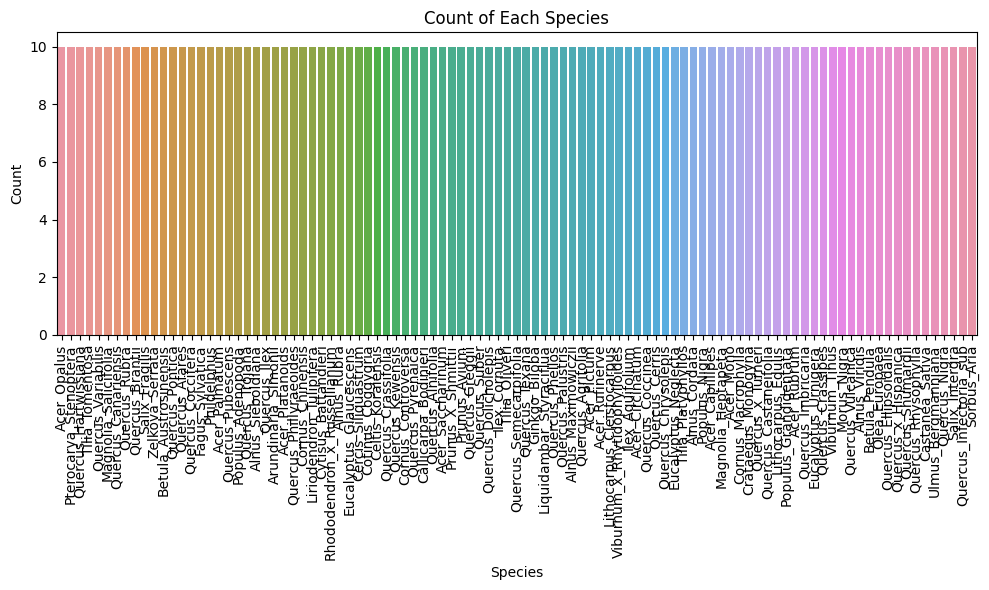

In [18]:
plt.figure(figsize=(10, 6))
sns.countplot(data=train_data, x='species')
plt.title('Count of Each Species')
plt.xlabel('Species')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


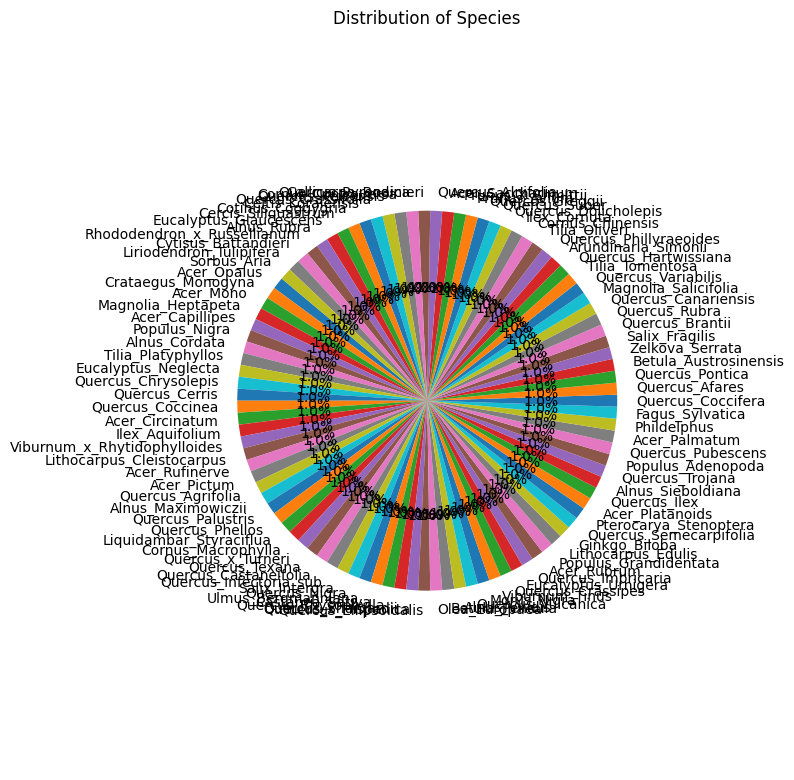

In [19]:
plt.figure(figsize=(8, 8))
plt.pie(species_counts, labels=species_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Species')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()
plt.show()

C:\Users\rana ahmed\AppData\Local\Temp\ipykernel_12188\3416239234.py:21: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


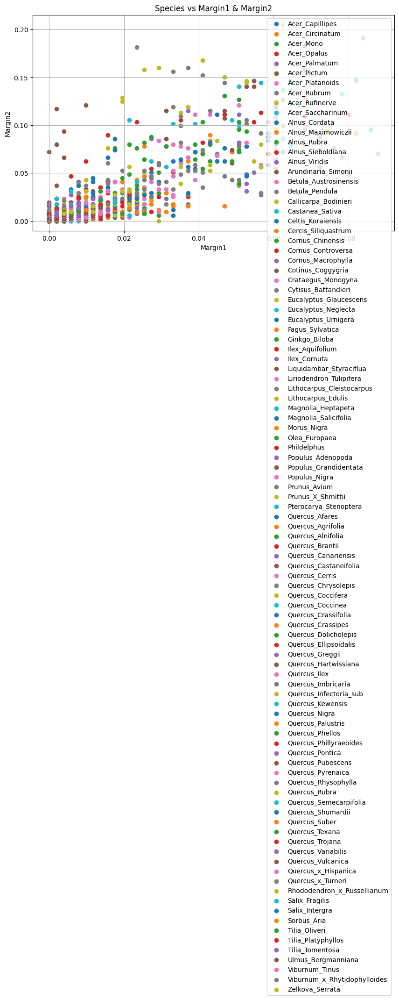

In [20]:

# Choosing 'species', 'margin1', and 'margin2' columns for visualization
cols_to_visualize = ['species', 'margin1', 'margin2']

# Extracting the specified columns
data_to_visualize = train_data[cols_to_visualize]

# Grouping data by species for separate plotting
species_groups = data_to_visualize.groupby('species')

# Creating scatter plots for margin1 and margin2 for each species
plt.figure(figsize=(10, 6))

for species, group in species_groups:
    plt.scatter(group['margin1'], group['margin2'], label=species)

plt.title('Species vs Margin1 & Margin2')
plt.xlabel('Margin1')
plt.ylabel('Margin2')
plt.legend()
plt.grid(True)
plt.tight_layout()

<Figure size 1000x1000 with 0 Axes>

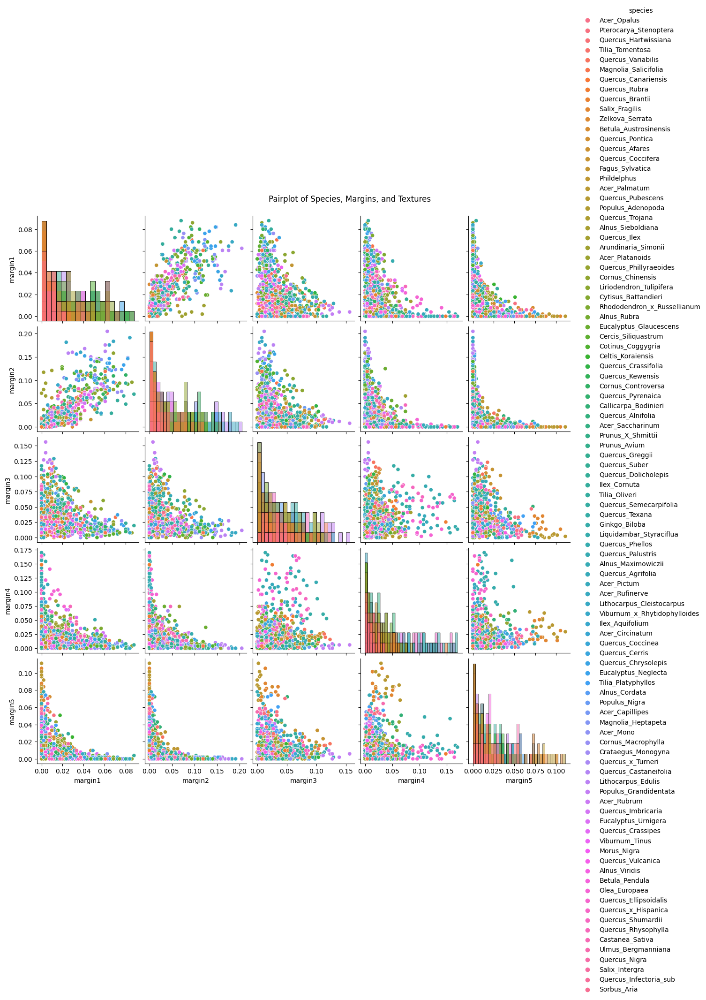

In [21]:
columns_to_plot = ['species', 'margin1', 'margin2','margin3','margin4','margin5']  # Add more columns as needed

# Extracting the specified columns
data_for_pairplot = train_data[columns_to_plot]
plt.figure(figsize=(10, 10))

# Creating the pairplot
sns.pairplot(data_for_pairplot, hue='species', diag_kind='hist')
plt.suptitle('Pairplot of Species, Margins, and Textures', y=1.02)
plt.show()

C:\Users\rana ahmed\AppData\Local\Temp\ipykernel_12188\923543505.py:16: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


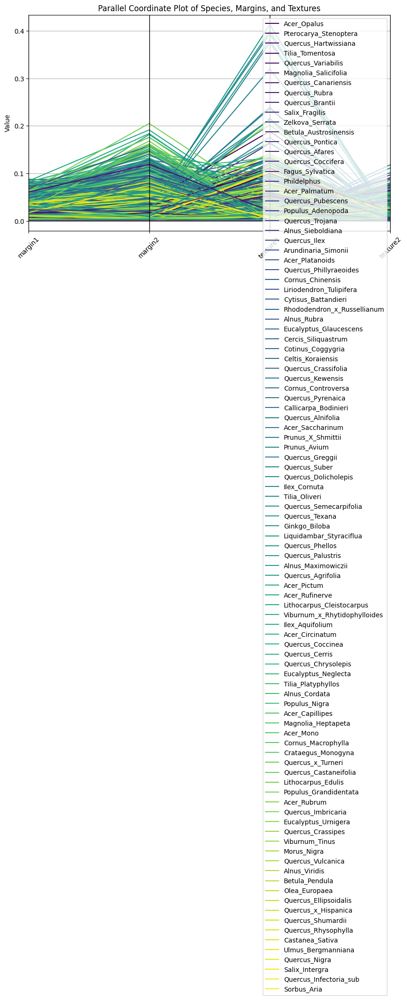

In [22]:
from pandas.plotting import parallel_coordinates

# Selecting columns for the parallel coordinate plot (replace with your column names)
columns_to_plot = ['species', 'margin1', 'margin2', 'texture1', 'texture2']  # Add more columns as needed

# Extracting the specified columns
data_for_parallel_plot = train_data[columns_to_plot]

# Creating the parallel coordinate plot
plt.figure(figsize=(10, 6))
parallel_coordinates(data_for_parallel_plot, 'species', colormap='viridis')
plt.title('Parallel Coordinate Plot of Species, Margins, and Textures')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

C:\Users\rana ahmed\AppData\Local\Temp\ipykernel_12188\2301645607.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_data[col])
C:\Users\rana ahmed\AppData\Local\Temp\ipykernel_12188\2301645607.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_data[col])
C:\Users\rana ahmed\AppDat

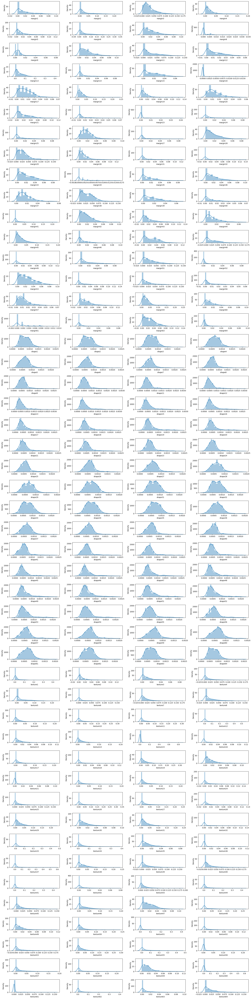

In [23]:
plt.figure(figsize=(20, 80))

columns = 4
i = 0

# Iterate through float columns and create subplots for distribution plots
for col in train_data.select_dtypes('float'):
    plt.subplot(train_data.shape[1] // columns + 1, columns, i + 1)
    sns.distplot(train_data[col])
    i += 1

plt.tight_layout()
plt.show()

### 5) Draw some of the images

In [24]:
image_folder = r"C:\Users\rana ahmed\Desktop\Senior_2\deepLearingproject\Leaf-Classification\leaf-classification\images"
image_filenames = sorted(os.listdir(image_folder))

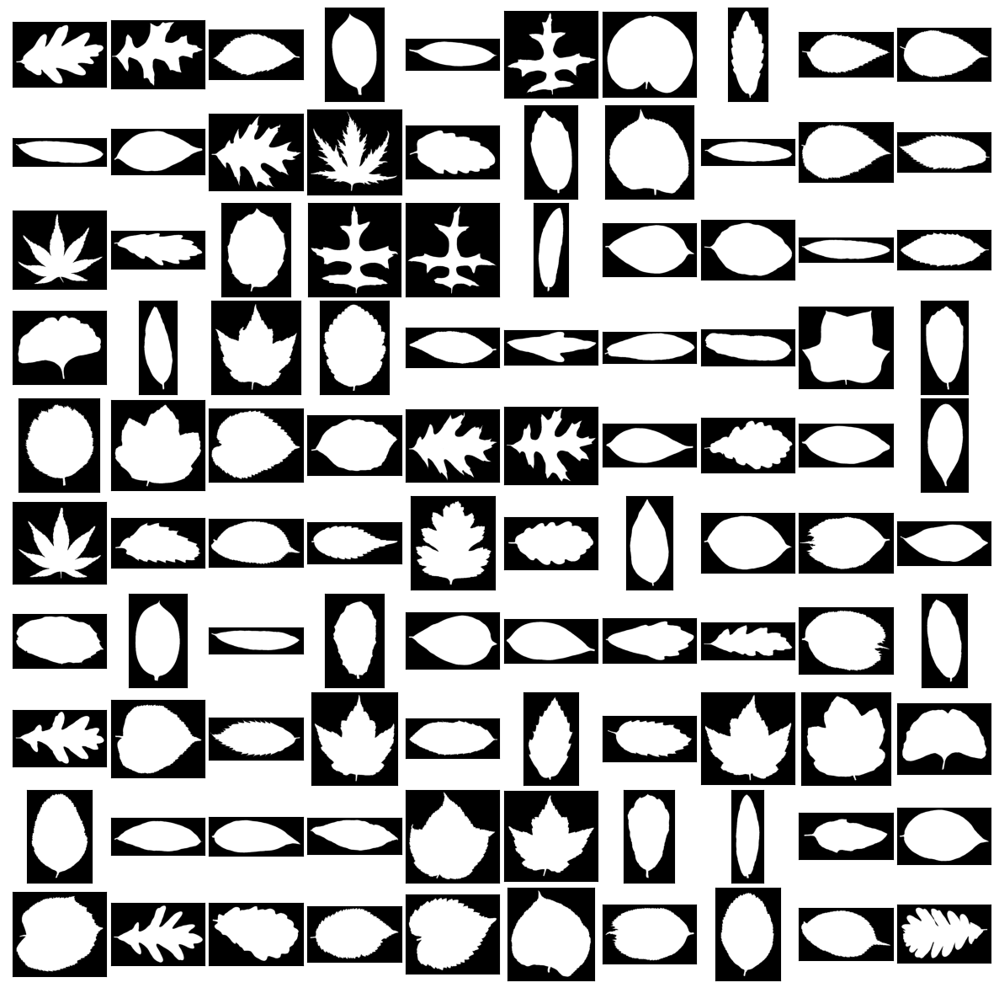

In [25]:
from matplotlib import gridspec
from PIL import Image

# Creating a new figure for plotting, setting its size
fig = plt.figure(figsize=(15, 15))

# Creating a 10x10 grid layout for displaying images with specified spacing
gs = gridspec.GridSpec(10, 10, wspace=0.05, hspace=0.05)

# Looping through a subset of image filenames (from index 100 to 199)
for i, image_filename in enumerate(image_filenames[100:200]):
    # Creating the full path to each image file
    image_path = os.path.join(image_folder, image_filename)
    
    # Opening and converting the image to a binary (black and white) format using PIL
    img = Image.open(image_path).convert('1')
    
    # Creating a subplot in the grid layout for the current image
    ax = plt.subplot(gs[i])
    
    # Removing ticks (axis markers) on both x and y axes
    ax.set_xticks([])
    ax.set_yticks([])
    
    # Displaying the image on the subplot
    plt.imshow(img)

# Displaying the plot with the grid of images
plt.show()

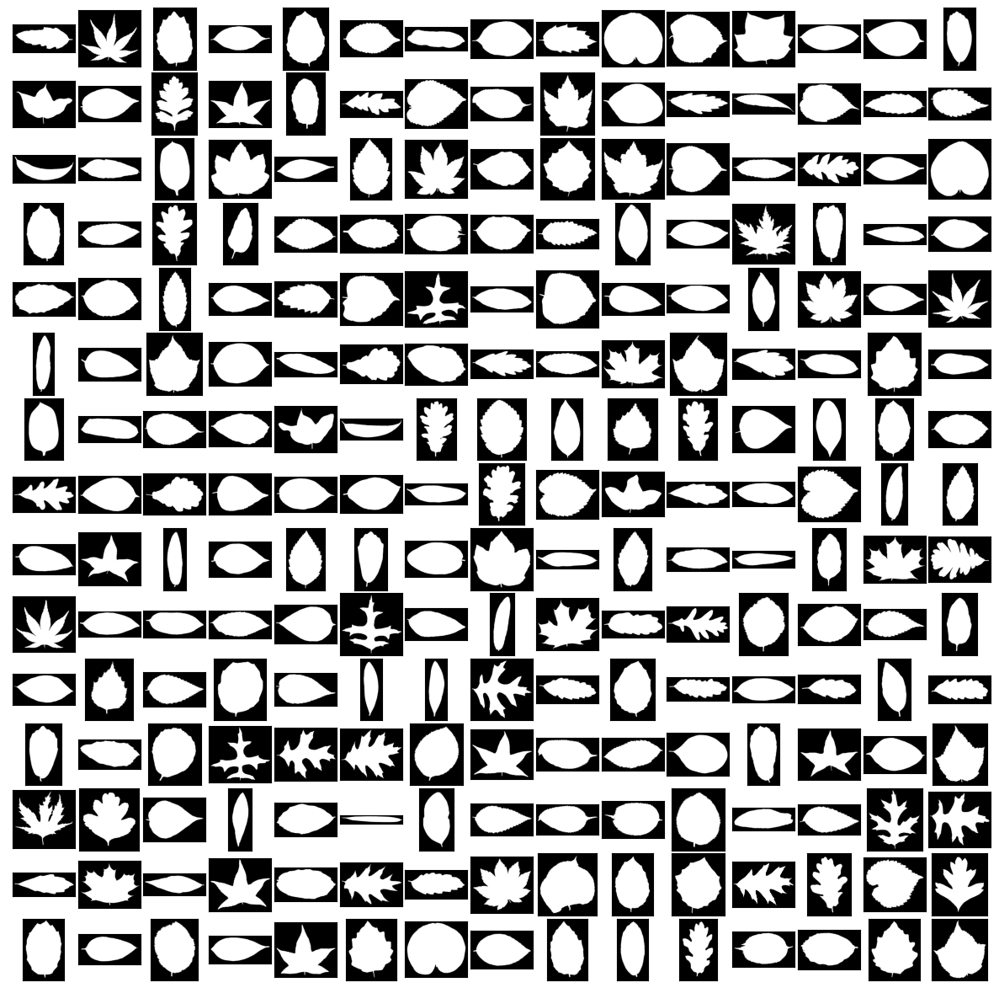

In [26]:
fig = plt.figure(figsize=(15, 15))
gs = gridspec.GridSpec(15, 15, wspace=0.05, hspace=0.05)

for i, image_filename in enumerate(image_filenames[700:925]):
    image_path = os.path.join(image_folder, image_filename)
    
    img = Image.open(image_path).convert('1')
    
    ax = plt.subplot(gs[i])
    
    ax.set_xticks([])
    ax.set_yticks([])
    
    plt.imshow(img)

plt.show()

### 6) Carry out required correlation analysis

#### Correlation between margin features

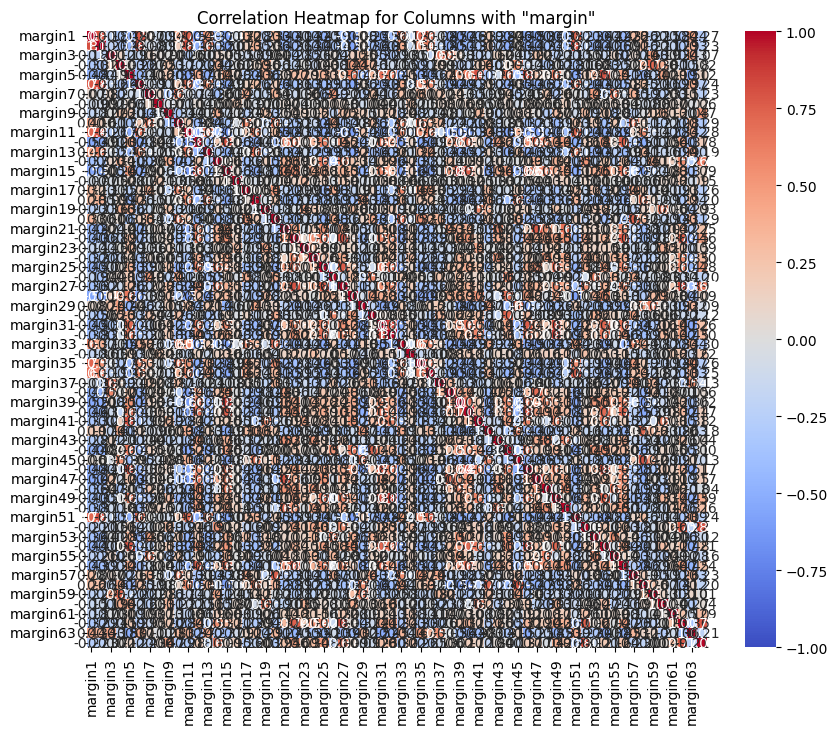

In [27]:
margin_columns = train_data.filter(like='margin')

# Creating the correlation matrix
correlation_matrix = margin_columns.corr()

# Generating a heatmap to visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix,vmin=-1,vmax=1, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap for Columns with "margin"')
plt.show()

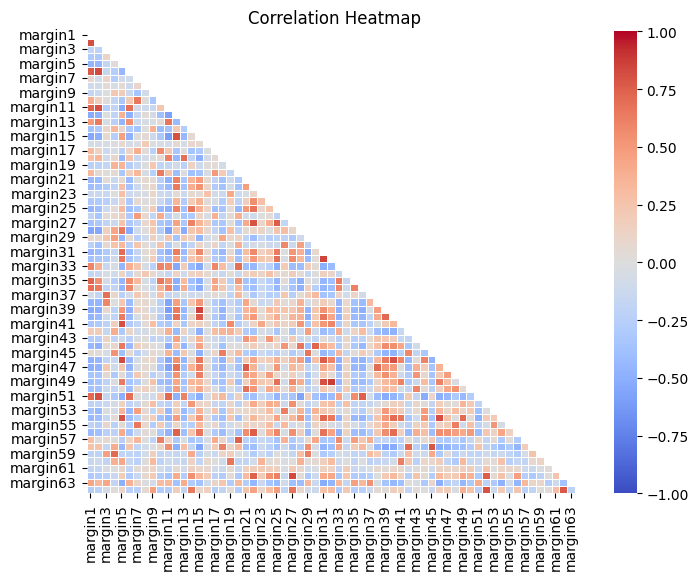

In [28]:
plt.figure(figsize=(8, 6))

# First heatmap
sns.heatmap(correlation_matrix,vmin=-1,vmax=1,center=0,cmap='coolwarm',
    mask=np.triu(np.ones_like(correlation_matrix, dtype=bool)),
    linewidths=0.5,
)
plt.title('Correlation Heatmap')
plt.show()

In [29]:
threshold = 0.8  # Set your threshold for high correlation

# Select upper triangle of correlation matrix
upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(np.bool))

# Find highly correlated features based on threshold
high_correlation = upper.abs() > threshold

# Extract highly correlated feature pairs and their correlation values
high_correlation_pairs = (upper[high_correlation].stack().reset_index().rename(columns={0: 'correlation'}))

# Filter out self-correlation (correlation of a feature with itself)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs['level_0'] != high_correlation_pairs['level_1']]
print(f"We have 64 feature contain margin in our dataset")

# Print highly correlated features and their correlation percentages
for index, row in high_correlation_pairs.iterrows():
    feat1 = row['level_0']
    feat2 = row['level_1']
    corr_percentage = row['correlation'] 
    print(f"{feat1} and {feat2} contain high correlation equal {corr_percentage:.2f}")

We have 64 feature contain margin in our dataset
margin1 and margin2 contain high correlation equal 0.81
margin2 and margin6 contain high correlation equal 0.83
margin2 and margin11 contain high correlation equal 0.81
margin2 and margin51 contain high correlation equal 0.81
margin5 and margin41 contain high correlation equal 0.81
margin5 and margin46 contain high correlation equal 0.83
margin12 and margin15 contain high correlation equal 0.81
margin15 and margin39 contain high correlation equal 0.85
margin27 and margin62 contain high correlation equal 0.83
margin31 and margin32 contain high correlation equal 0.85
margin31 and margin49 contain high correlation equal 0.81
margin32 and margin49 contain high correlation equal 0.87
margin40 and margin46 contain high correlation equal 0.81
margin46 and margin54 contain high correlation equal 0.81
margin52 and margin64 contain high correlation equal 0.80


C:\Users\rana ahmed\AppData\Local\Temp\ipykernel_12188\2849507748.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(np.bool))


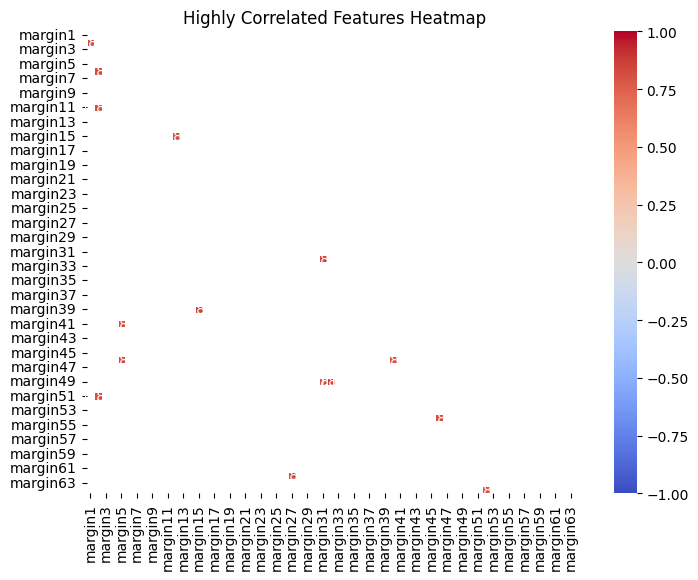

In [30]:
threshold = 0.8  # Set your threshold for high correlation

# Create a mask to select the lower triangle of the correlation matrix
lower_triangle_mask = np.tril(np.ones_like(correlation_matrix, dtype=bool), k=-1)

# Mask values below the threshold to display only highly correlated values in the lower triangle
high_correlation_mask = np.abs(correlation_matrix) > threshold
high_correlation_matrix = correlation_matrix.where(high_correlation_mask & lower_triangle_mask)


plt.figure(figsize=(8, 6))

# Create the heatmap for highly correlated features
sns.heatmap(
    high_correlation_matrix,
    vmin=-1,
    vmax=1,
    center=0,
    cmap='coolwarm',
    annot=True,  # Show values in heatmap
    fmt=".2f",   # Format for annotation (two decimal places)
    linewidths=0.5,
)

plt.title('Highly Correlated Features Heatmap')
plt.show()

#### Correlation between shape features

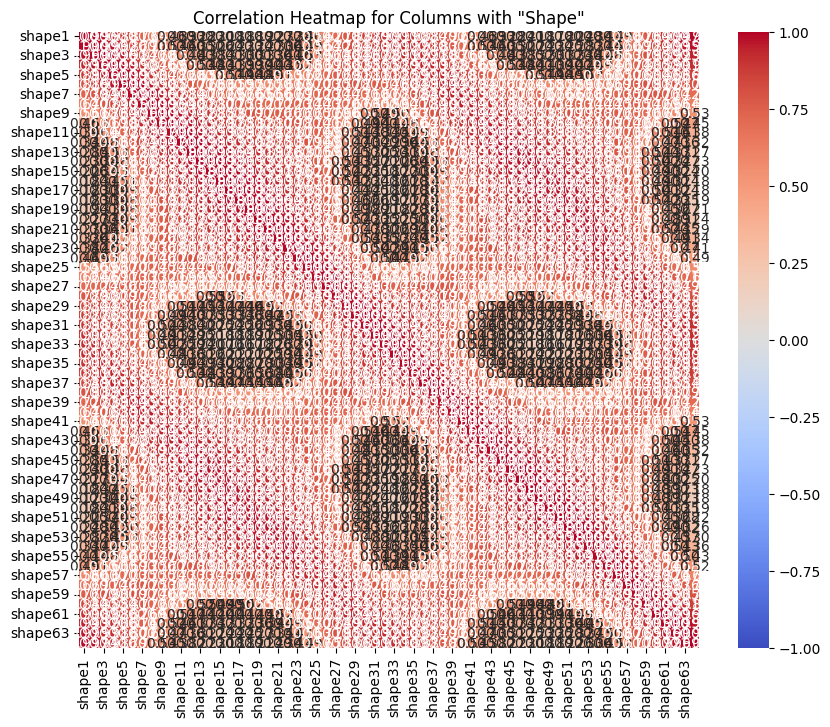

In [31]:
shape_columns = train_data.filter(like='shape')

# Creating the correlation matrix
correlation_matrix2 = shape_columns.corr()

# Generating a heatmap to visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix2,vmin=-1,vmax=1, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap for Columns with "Shape"')
plt.show()

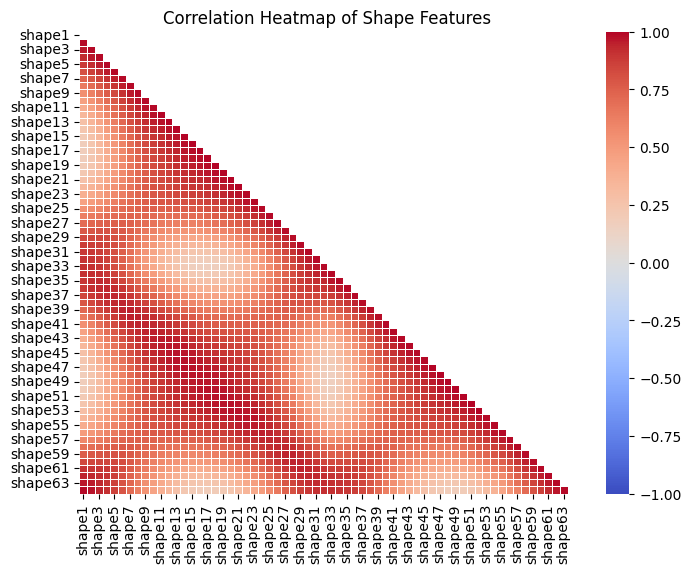

In [32]:
plt.figure(figsize=(8, 6))

# First heatmap
sns.heatmap(correlation_matrix2,vmin=-1,vmax=1,center=0,cmap='coolwarm',
    mask=np.triu(np.ones_like(correlation_matrix2, dtype=bool)),
    linewidths=0.5,
)
plt.title('Correlation Heatmap of Shape Features')
plt.show()

In [33]:
threshold = 0.8  # Set your threshold for high correlation

# Select upper triangle of correlation matrix
upper = correlation_matrix2.where(np.triu(np.ones(correlation_matrix2.shape), k=1).astype(np.bool))

# Find highly correlated features based on threshold
high_correlation = upper.abs() > threshold

# Extract highly correlated feature pairs and their correlation values
high_correlation_pairs = (upper[high_correlation].stack().reset_index().rename(columns={0: 'correlation'}))

# Filter out self-correlation (correlation of a feature with itself)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs['level_0'] != high_correlation_pairs['level_1']]
print(f"We have 64 feature contain shape in our dataset")

# Print highly correlated features and their correlation percentages
for index, row in high_correlation_pairs.iterrows():
    feat1 = row['level_0']
    feat2 = row['level_1']
    corr_percentage = row['correlation'] 
    print(f"{feat1} and {feat2} contain high correlation equal {corr_percentage:.2f}")

We have 64 feature contain shape in our dataset
shape1 and shape2 contain high correlation equal 0.99
shape1 and shape3 contain high correlation equal 0.96
shape1 and shape4 contain high correlation equal 0.93
shape1 and shape5 contain high correlation equal 0.88
shape1 and shape6 contain high correlation equal 0.81
shape1 and shape29 contain high correlation equal 0.83
shape1 and shape30 contain high correlation equal 0.87
shape1 and shape31 contain high correlation equal 0.89
shape1 and shape32 contain high correlation equal 0.90
shape1 and shape33 contain high correlation equal 0.91
shape1 and shape34 contain high correlation equal 0.91
shape1 and shape35 contain high correlation equal 0.90
shape1 and shape36 contain high correlation equal 0.88
shape1 and shape37 contain high correlation equal 0.84
shape1 and shape60 contain high correlation equal 0.84
shape1 and shape61 contain high correlation equal 0.90
shape1 and shape62 contain high correlation equal 0.94
shape1 and shape63 con

C:\Users\rana ahmed\AppData\Local\Temp\ipykernel_12188\3791970009.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = correlation_matrix2.where(np.triu(np.ones(correlation_matrix2.shape), k=1).astype(np.bool))


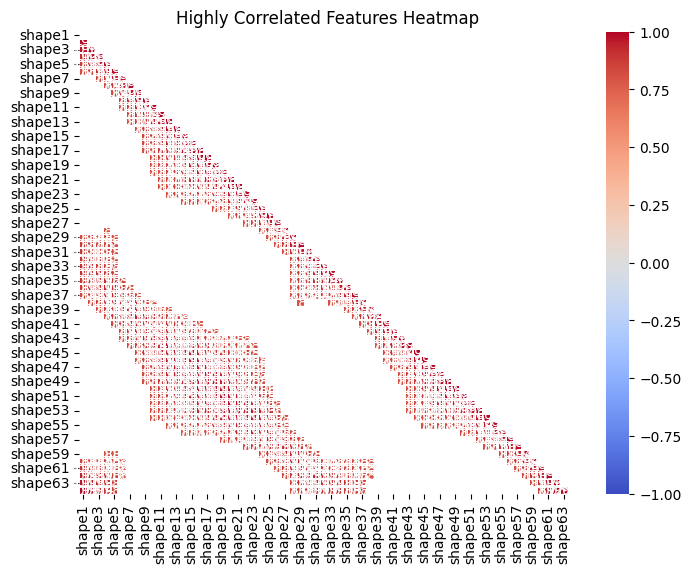

In [34]:
threshold = 0.8  # Set your threshold for high correlation

# Create a mask to select the lower triangle of the correlation matrix
lower_triangle_mask = np.tril(np.ones_like(correlation_matrix2, dtype=bool), k=-1)

# Mask values below the threshold to display only highly correlated values in the lower triangle
high_correlation_mask = np.abs(correlation_matrix2) > threshold
high_correlation_matrix = correlation_matrix2.where(high_correlation_mask & lower_triangle_mask)

plt.figure(figsize=(8, 6))

# Create the heatmap for highly correlated features
sns.heatmap(
    high_correlation_matrix,
    vmin=-1,
    vmax=1,
    center=0,
    cmap='coolwarm',
    annot=True,  # Show values in heatmap
    fmt=".2f",   # Format for annotation (two decimal places)
    linewidths=0.5,
)

plt.title('Highly Correlated Features Heatmap')
plt.show()

#### Correlation between texture features

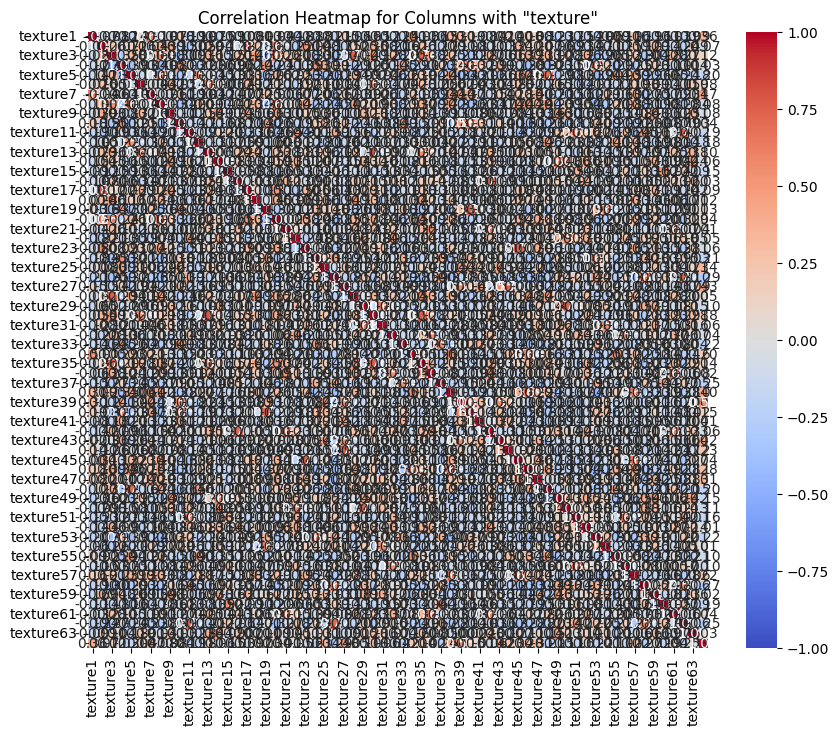

In [35]:
texture_columns = train_data.filter(like='texture')

# Creating the correlation matrix
correlation_matrix3 = texture_columns.corr()

# Generating a heatmap to visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix3,vmin=-1,vmax=1, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap for Columns with "texture"')
plt.show()

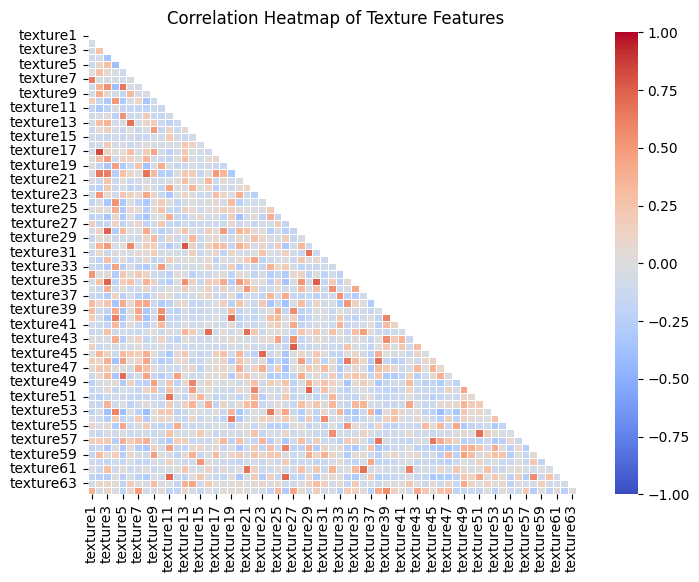

In [36]:
plt.figure(figsize=(8, 6))

# First heatmap
sns.heatmap(correlation_matrix3,vmin=-1,vmax=1,center=0,cmap='coolwarm',
    mask=np.triu(np.ones_like(correlation_matrix3, dtype=bool)),
    linewidths=0.5,
)
plt.title('Correlation Heatmap of Texture Features')
plt.show()

In [37]:
threshold = 0.7  # Set your threshold for high correlation

# Select upper triangle of correlation matrix
upper = correlation_matrix3.where(np.triu(np.ones(correlation_matrix3.shape), k=1).astype(np.bool))

# Find highly correlated features based on threshold
high_correlation = upper.abs() > threshold

# Extract highly correlated feature pairs and their correlation values
high_correlation_pairs = (upper[high_correlation].stack().reset_index().rename(columns={0: 'correlation'}))

# Filter out self-correlation (correlation of a feature with itself)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs['level_0'] != high_correlation_pairs['level_1']]
print(f"We have 64 feature contain texture in our dataset")

# Print highly correlated features and their correlation percentages
for index, row in high_correlation_pairs.iterrows():
    feat1 = row['level_0']
    feat2 = row['level_1']
    corr_percentage = row['correlation'] 
    print(f"{feat1} and {feat2} contain high correlation equal {corr_percentage:.2f}")

We have 64 feature contain texture in our dataset
texture2 and texture17 contain high correlation equal 0.82
texture3 and texture28 contain high correlation equal 0.74
texture3 and texture35 contain high correlation equal 0.74
texture5 and texture48 contain high correlation equal 0.70
texture11 and texture62 contain high correlation equal 0.72
texture13 and texture30 contain high correlation equal 0.79
texture19 and texture40 contain high correlation equal 0.73
texture23 and texture45 contain high correlation equal 0.72
texture26 and texture62 contain high correlation equal 0.72
texture27 and texture44 contain high correlation equal 0.76
texture29 and texture50 contain high correlation equal 0.73
texture30 and texture35 contain high correlation equal 0.76


C:\Users\rana ahmed\AppData\Local\Temp\ipykernel_12188\2775120977.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = correlation_matrix3.where(np.triu(np.ones(correlation_matrix3.shape), k=1).astype(np.bool))


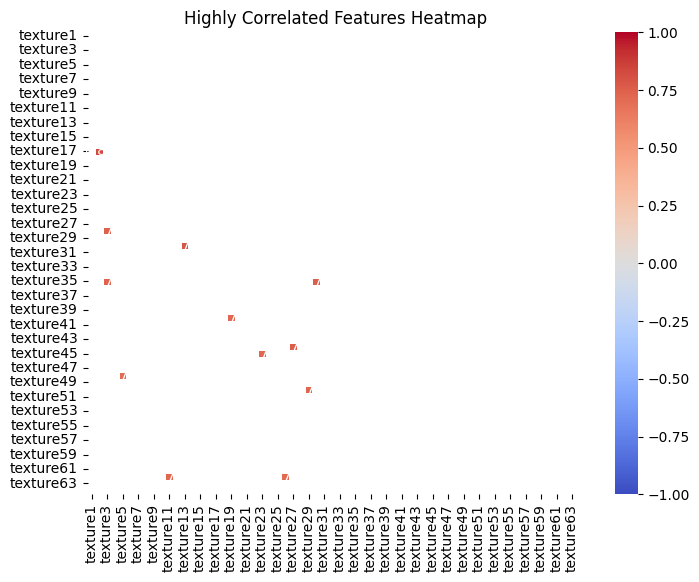

In [38]:
threshold = 0.7  # Set your threshold for high correlation

# Create a mask to select the lower triangle of the correlation matrix
lower_triangle_mask = np.tril(np.ones_like(correlation_matrix3, dtype=bool), k=-1)

# Mask values below the threshold to display only highly correlated values in the lower triangle
high_correlation_mask = np.abs(correlation_matrix3) > threshold
high_correlation_matrix = correlation_matrix3.where(high_correlation_mask & lower_triangle_mask)

plt.figure(figsize=(8, 6))

# Create the heatmap for highly correlated features
sns.heatmap(
    high_correlation_matrix,
    vmin=-1,
    vmax=1,
    center=0,
    cmap='coolwarm',
    annot=True,  # Show values in heatmap
    fmt=".2f",   # Format for annotation (two decimal places)
    linewidths=0.5,
)

plt.title('Highly Correlated Features Heatmap')
plt.show()

#### correlation of all features 

C:\Users\rana ahmed\AppData\Local\Temp\ipykernel_12188\343507878.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix4 = train_data.corr()


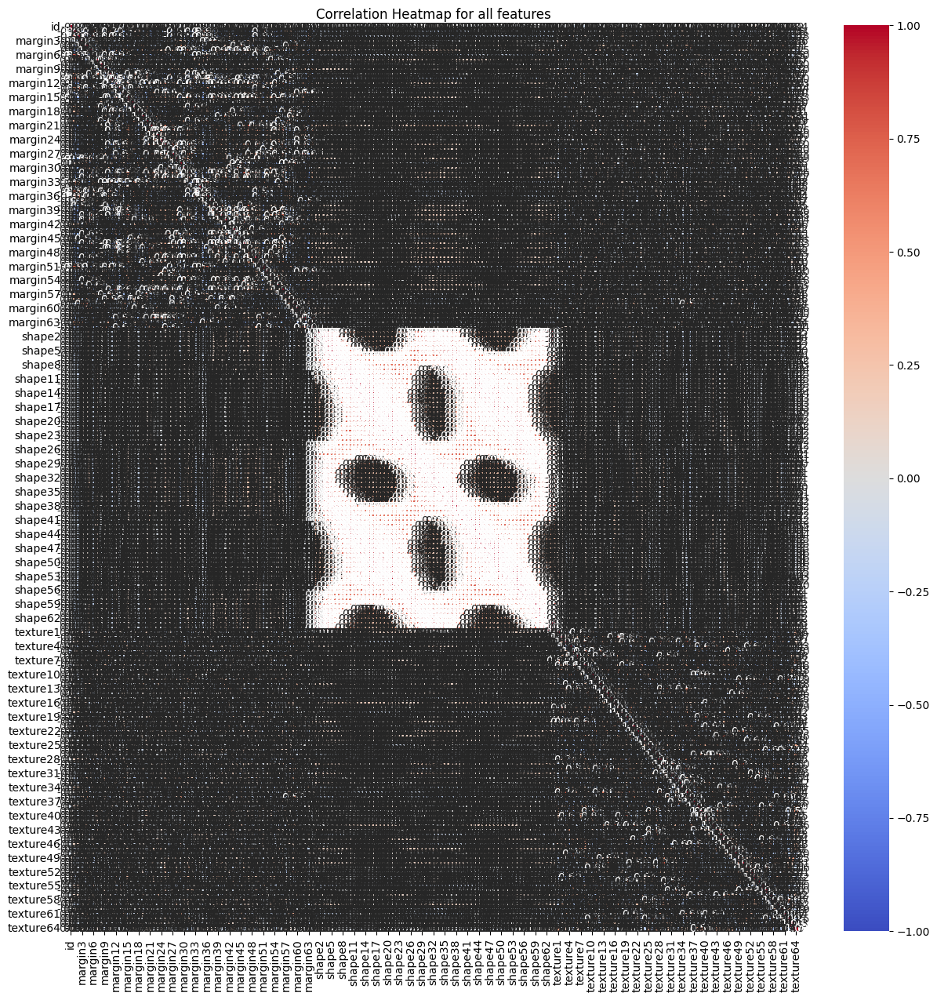

In [39]:

# Creating the correlation matrix
correlation_matrix4 = train_data.corr()

# Generating a heatmap to visualize the correlation matrix
plt.figure(figsize=(15,15))
sns.heatmap(correlation_matrix4,vmin=-1,vmax=1, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap for all features')
plt.show()

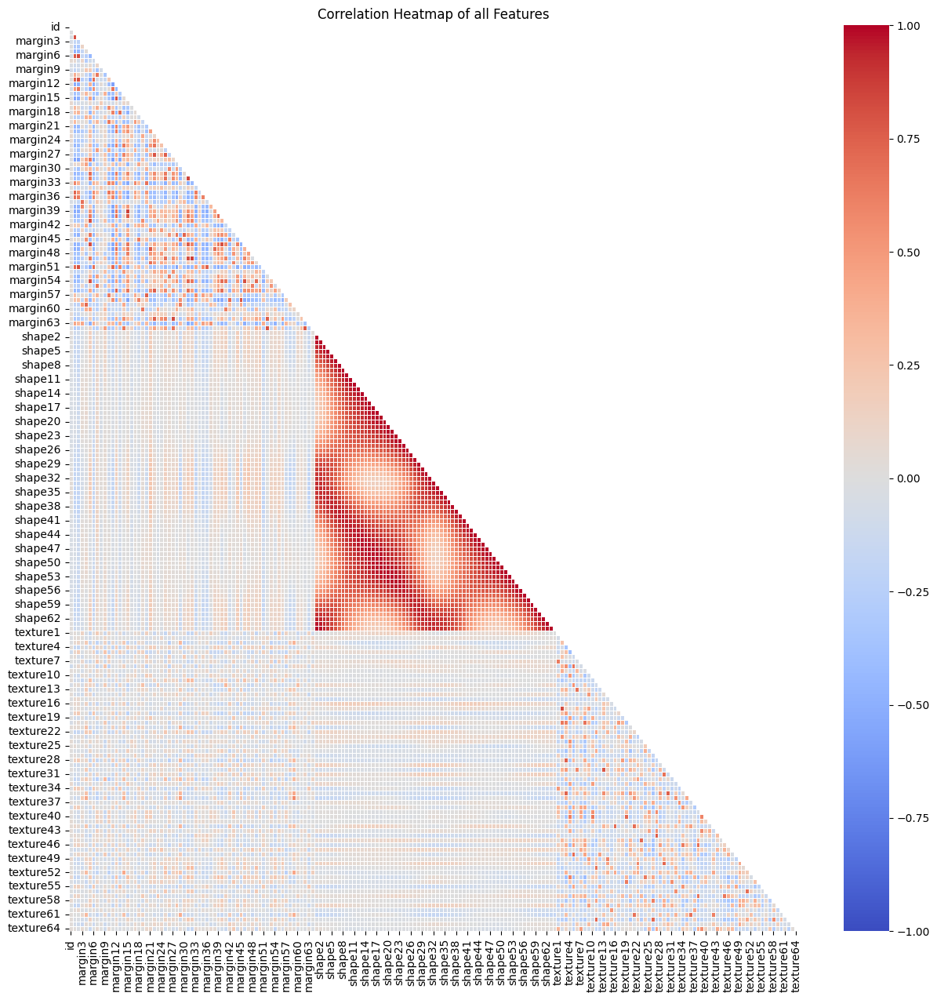

In [40]:
plt.figure(figsize=(15, 15))

# First heatmap
sns.heatmap(correlation_matrix4,vmin=-1,vmax=1,center=0,cmap='coolwarm',
    mask=np.triu(np.ones_like(correlation_matrix4, dtype=bool)),
    linewidths=0.5,
)
plt.title('Correlation Heatmap of all Features')
plt.show()

In [41]:
threshold = 0.8 # Set your threshold for high correlation

# Select upper triangle of correlation matrix
upper = correlation_matrix4.where(np.triu(np.ones(correlation_matrix4.shape), k=1).astype(np.bool))

# Find highly correlated features based on threshold
high_correlation = upper.abs() > threshold

# Extract highly correlated feature pairs and their correlation values
high_correlation_pairs = (upper[high_correlation].stack().reset_index().rename(columns={0: 'correlation'}))

# Filter out self-correlation (correlation of a feature with itself)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs['level_0'] != high_correlation_pairs['level_1']]
print(f"We have 64 feature contain texture in our dataset")

# Print highly correlated features and their correlation percentages
for index, row in high_correlation_pairs.iterrows():
    feat1 = row['level_0']
    feat2 = row['level_1']
    corr_percentage = row['correlation'] 
    print(f"{feat1} and {feat2} contain high correlation equal {corr_percentage:.2f}")

We have 64 feature contain texture in our dataset
margin1 and margin2 contain high correlation equal 0.81
margin2 and margin6 contain high correlation equal 0.83
margin2 and margin11 contain high correlation equal 0.81
margin2 and margin51 contain high correlation equal 0.81
margin5 and margin41 contain high correlation equal 0.81
margin5 and margin46 contain high correlation equal 0.83
margin12 and margin15 contain high correlation equal 0.81
margin15 and margin39 contain high correlation equal 0.85
margin27 and margin62 contain high correlation equal 0.83
margin31 and margin32 contain high correlation equal 0.85
margin31 and margin49 contain high correlation equal 0.81
margin32 and margin49 contain high correlation equal 0.87
margin40 and margin46 contain high correlation equal 0.81
margin46 and margin54 contain high correlation equal 0.81
margin52 and margin64 contain high correlation equal 0.80
shape1 and shape2 contain high correlation equal 0.99
shape1 and shape3 contain high cor

C:\Users\rana ahmed\AppData\Local\Temp\ipykernel_12188\1555256487.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = correlation_matrix4.where(np.triu(np.ones(correlation_matrix4.shape), k=1).astype(np.bool))


#### 7) Label encoding 

In [42]:
# Label Encoding
def encode(df_train,df_test):
    le = LabelEncoder().fit(df_train.species)
    labels = le.transform(df_train.species) # Species are in stings 
    
    classes = list(le.classes_) #creating list of column names for submission
    
    test_ids = df_test.id # creating variable for IDs
    
    df_train = df_train.drop(['species','id'],axis = 1) #droping columns 
    df_test = df_test.drop(['id'],axis = 1)

    return df_train, labels, classes, test_ids, df_test

train_encoding, labels, classes, test_ids, test_encoding = encode(train_data,test_data)

In [43]:
train_encoding

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,0.001953,0.033203,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.000000,0.000000,0.004883,0.000000,0.025391
1,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,0.000000,0.007812,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.000000,0.000000,0.000977,0.039062,0.022461
2,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,0.000000,0.044922,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.000000,0.000000,0.000000,0.020508,0.002930
3,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,0.013672,0.017578,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.000000,0.000000,0.017578,0.000000,0.047852
4,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,0.000000,0.005859,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,0.060547,0.119140,0.007812,0.003906,0.000000,0.148440,0.017578,0.0,0.001953,0.042969,...,0.242190,0.000000,0.034180,0.000000,0.010742,0.000000,0.000000,0.000000,0.000000,0.018555
986,0.001953,0.003906,0.021484,0.107420,0.001953,0.000000,0.000000,0.0,0.029297,0.003906,...,0.170900,0.000000,0.018555,0.000000,0.011719,0.000000,0.000000,0.000977,0.000000,0.021484
987,0.001953,0.003906,0.000000,0.021484,0.078125,0.003906,0.007812,0.0,0.003906,0.000000,...,0.004883,0.000977,0.004883,0.027344,0.016602,0.007812,0.000000,0.027344,0.000000,0.001953
988,0.000000,0.000000,0.046875,0.056641,0.009766,0.000000,0.000000,0.0,0.037109,0.001953,...,0.083008,0.030273,0.000977,0.002930,0.014648,0.000000,0.041992,0.000000,0.001953,0.002930


In [44]:
test_encoding

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,0.019531,0.009766,0.078125,0.011719,0.003906,0.015625,0.005859,0.000000,0.005859,0.023438,...,0.006836,0.000000,0.015625,0.000977,0.015625,0.0,0.0,0.000000,0.003906,0.053711
1,0.007812,0.005859,0.064453,0.009766,0.003906,0.013672,0.007812,0.000000,0.033203,0.023438,...,0.000000,0.000000,0.006836,0.001953,0.013672,0.0,0.0,0.000977,0.037109,0.044922
2,0.000000,0.000000,0.001953,0.021484,0.041016,0.000000,0.023438,0.000000,0.011719,0.005859,...,0.128910,0.000000,0.000977,0.000000,0.000000,0.0,0.0,0.015625,0.000000,0.000000
3,0.000000,0.000000,0.009766,0.011719,0.017578,0.000000,0.003906,0.000000,0.003906,0.001953,...,0.012695,0.015625,0.002930,0.036133,0.013672,0.0,0.0,0.089844,0.000000,0.008789
4,0.001953,0.000000,0.015625,0.009766,0.039062,0.000000,0.009766,0.000000,0.005859,0.000000,...,0.000000,0.042969,0.016602,0.010742,0.041016,0.0,0.0,0.007812,0.009766,0.007812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,0.000000,0.000000,0.003906,0.015625,0.041016,0.000000,0.017578,0.000000,0.005859,0.013672,...,0.098633,0.000000,0.004883,0.000000,0.003906,0.0,0.0,0.018555,0.000000,0.000977
590,0.000000,0.003906,0.003906,0.005859,0.017578,0.000000,0.017578,0.005859,0.000000,0.005859,...,0.012695,0.004883,0.004883,0.002930,0.009766,0.0,0.0,0.090820,0.000000,0.016602
591,0.017578,0.029297,0.015625,0.013672,0.003906,0.015625,0.025391,0.000000,0.000000,0.009766,...,0.073242,0.000000,0.028320,0.000000,0.001953,0.0,0.0,0.000000,0.042969,0.006836
592,0.013672,0.009766,0.060547,0.025391,0.035156,0.025391,0.039062,0.000000,0.003906,0.023438,...,0.003906,0.000000,0.000977,0.000000,0.011719,0.0,0.0,0.000000,0.011719,0.018555


In [45]:
labels

array([ 3, 49, 65, 94, 84, 40, 54, 78, 53, 89, 98, 16, 74, 50, 58, 31, 43,
        4, 75, 44, 83, 84, 13, 66, 15,  6, 73, 22, 73, 31, 36, 27, 94, 88,
       12, 28, 21, 25, 20, 60, 84, 65, 69, 58, 23, 76, 18, 52, 54,  9, 48,
       47, 64, 81, 83, 36, 58, 21, 81, 20, 62, 88, 34, 92, 79, 82, 20, 32,
        4, 84, 36, 35, 72, 60, 71, 72, 52, 50, 54, 11, 51, 18, 47,  5,  8,
       37, 97, 20, 33,  1, 59,  1, 56,  1,  9, 57, 20, 79, 29, 16, 32, 54,
       93, 10, 46, 59, 84, 76, 15, 10, 15,  0, 69,  4, 51, 51, 94, 36, 39,
       62,  2, 24, 26, 35, 25, 87,  0, 55, 34, 38,  1, 45,  7, 93, 56, 38,
       21, 51, 75, 81, 74, 33, 20, 37,  9, 40, 60, 31, 83, 50, 71, 67, 30,
       66,  1, 43, 61, 23, 65, 84, 87, 46, 57, 16,  2, 28, 12, 96, 44, 76,
       29, 75, 41, 87, 67, 61, 30,  5, 12, 62,  3, 83, 81,  6, 85,  4, 37,
       57, 84, 39, 71, 61,  6, 76, 14, 31, 98, 40, 17, 51, 16, 42, 63, 86,
       37, 69, 86, 71, 80, 78, 14, 35, 25,  5, 39,  8,  9, 26, 44, 60, 13,
       14, 77, 13, 80, 87

In [46]:
classes

['Acer_Capillipes',
 'Acer_Circinatum',
 'Acer_Mono',
 'Acer_Opalus',
 'Acer_Palmatum',
 'Acer_Pictum',
 'Acer_Platanoids',
 'Acer_Rubrum',
 'Acer_Rufinerve',
 'Acer_Saccharinum',
 'Alnus_Cordata',
 'Alnus_Maximowiczii',
 'Alnus_Rubra',
 'Alnus_Sieboldiana',
 'Alnus_Viridis',
 'Arundinaria_Simonii',
 'Betula_Austrosinensis',
 'Betula_Pendula',
 'Callicarpa_Bodinieri',
 'Castanea_Sativa',
 'Celtis_Koraiensis',
 'Cercis_Siliquastrum',
 'Cornus_Chinensis',
 'Cornus_Controversa',
 'Cornus_Macrophylla',
 'Cotinus_Coggygria',
 'Crataegus_Monogyna',
 'Cytisus_Battandieri',
 'Eucalyptus_Glaucescens',
 'Eucalyptus_Neglecta',
 'Eucalyptus_Urnigera',
 'Fagus_Sylvatica',
 'Ginkgo_Biloba',
 'Ilex_Aquifolium',
 'Ilex_Cornuta',
 'Liquidambar_Styraciflua',
 'Liriodendron_Tulipifera',
 'Lithocarpus_Cleistocarpus',
 'Lithocarpus_Edulis',
 'Magnolia_Heptapeta',
 'Magnolia_Salicifolia',
 'Morus_Nigra',
 'Olea_Europaea',
 'Phildelphus',
 'Populus_Adenopoda',
 'Populus_Grandidentata',
 'Populus_Nigra',
 'Pr

In [47]:
test_ids

0         4
1         7
2         9
3        12
4        13
       ... 
589    1576
590    1577
591    1579
592    1580
593    1583
Name: id, Length: 594, dtype: int64

In [48]:
labels.max(), labels.min()

(98, 0)

In [49]:
X= train_encoding.values
Y=labels

In [50]:
from sklearn import preprocessing, model_selection
scaler = preprocessing.StandardScaler()
X_train_Scaler = scaler.fit_transform(X)
X_test_scaler = scaler.transform(test_encoding.values)

In [51]:
X_train_Scaler

array([[-0.48661074, -0.13135701, -0.33095592, ..., -0.39487147,
        -0.65214311,  0.26239707],
       [-0.58560191, -0.73488047, -0.02856115, ..., -0.49497401,
         2.18166976,  0.13364087],
       [-0.58560191, -0.48340807, -0.48219201, ..., -0.52001246,
         0.83564129, -0.72463124],
       ...,
       [-0.78358426, -0.63430181, -1.23821765, ...,  0.1807566 ,
        -0.65214311, -0.76756462],
       [-0.88257543, -0.73488047,  0.5762671 , ..., -0.52001246,
        -0.51045972, -0.72463124],
       [ 0.30542003, -0.23196142, -0.02856115, ...,  0.08065405,
         1.18988604,  0.13364087]])

In [52]:
X_test_scaler

array([[ 0.10738699, -0.48340807,  1.7859236 , ..., -0.52001246,
        -0.36877633,  1.50689382],
       [-0.48661074, -0.58401248,  1.25669405, ..., -0.49497401,
         2.03998637,  1.12066917],
       [-0.88257543, -0.73488047, -1.16261896, ..., -0.11957666,
        -0.65214311, -0.85338743],
       ...,
       [ 0.00839582,  0.01951098, -0.6333894 , ..., -0.52001246,
         2.46510908, -0.5529856 ],
       [-0.18958653, -0.48340807,  1.10549666, ..., -0.52001246,
         0.19802977, -0.03800476],
       [-0.88257543,  2.28273681, -1.23821765, ..., -0.11957666,
        -0.65214311, -0.08093814]])